# ANALYSE RUN R=4, SEUIL = 20

In [1]:
import seaborn as sns
import scipy
import numpy as np
from matplotlib import pyplot as plt
import imageio
from IPython.display import Image, display
from matplotlib.colors import Normalize
import pandas as pd
import os

In [2]:
path = "/home/smauran/Developpement/QG_standalone_counillon_assim4pdt/analyse_R5_seuil10_infl102_1/"
#path = "/home/smauran/Developpement/QG_standalone_counillon/analyse_R4_seuil20/"


## Indices des observations

In [3]:
file_paths_obs_ind = [f"{path}obs_ind/obs_ind_{i}.npy" for i in range(150, 510, 5)]
arrays_obs_ind = [np.load(file_path) for file_path in file_paths_obs_ind]


rows_obs_ind = [arrays_obs_ind[i] % 129 for i in range(len(arrays_obs_ind))]
cols_obs_ind = [arrays_obs_ind[i] // 129 for i in range(len(arrays_obs_ind))]



FileNotFoundError: [Errno 2] No such file or directory: '/home/smauran/Developpement/QG_standalone_counillon_assim4pdt/analyse_R5_seuil10_infl102_1/obs_ind/obs_ind_150.npy'

## Truth

In [5]:
# Charger les matrices à partir des fichiers
file_paths_truth = [
    f"{path}truth/truth_{i}.npy" for i in range(150, 505, 5)
]

arrays_truth = [np.load(file_path) for file_path in file_paths_truth]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_truth]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
vmin = -65
vmax = 72
#print(vmin, vmax)
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    plt.figure(figsize=(10, 8))
    plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    #sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    #plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"truth.gif", images, duration=8) # durée en secondes


/tmp/ipykernel_2502884/3744646873.py:31: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


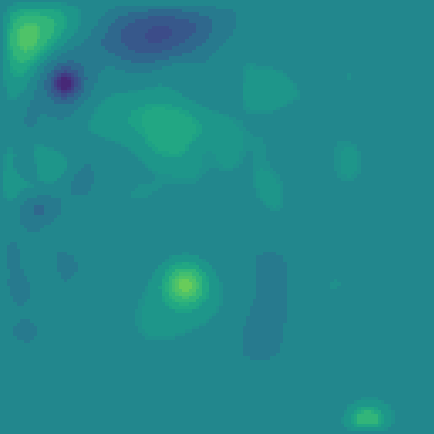

In [8]:
display(Image(filename=path+"truth.gif", format='png'))

## Ensemble avant assimilation

In [21]:


# Charger les matrices à partir des fichiers
file_paths = [
    f"{path}E_av/E_av_{i}.npy" for i in range(150, 1005, 5)
]

arrays_av = [np.load(file_path) for file_path in file_paths]
arrays_mean_av = [np.mean(array,axis=0) for array in arrays_av]
print(np.shape(arrays_mean_av))

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_mean_av]

# Calculer les bornes de l'échelle de couleur
vmin = min(array.min() for array in arrays_reshaped)
vmax = max(array.max() for array in arrays_reshaped)
#vmin = -65
#vmax = 72
#print(vmin, vmax)
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    plt.figure(figsize=(5, 4))
    #plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    #plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"E_av.gif", images, duration=100) # durée en secondes

(171, 16641)


/tmp/ipykernel_36841/766908859.py:33: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


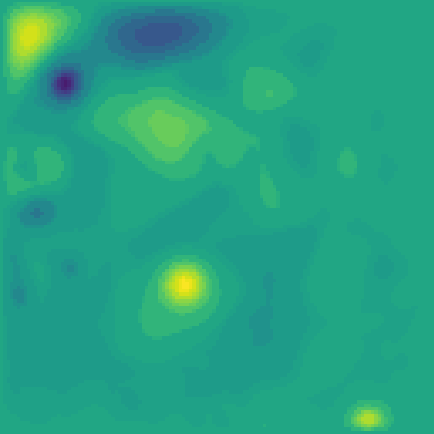

In [11]:
display(Image(filename=path+"E_av.gif", format='png'))

## RMSE locale avant assimilation

In [56]:
def compute_rmse(array1, array2):
    return np.sqrt((array1 - array2)**2)

arrays_rmse = [compute_rmse(array1,array2) for array1,array2 in zip(arrays_truth,arrays_mean_av)]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_rmse]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
#print(vmin, vmax)
vmin = 0
vmax = 60
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    #plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    plt.figure(figsize=(10, 8))
    sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"RMSE_av.gif", images, duration=8) # durée en secondes

/tmp/ipykernel_6727/2652174634.py:29: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## Clustering

In [12]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from skimage import measure
from matplotlib.path import Path
from math import ceil

def get_clusters(E,loc,rad,taper,j,i):
    # clustering sur les variables
    N, Nx = E.shape
    #print(N,Nx) 
    
    
    dist_xx, state_taperer = loc(rad,taper)

    nblimit=5
    vec_bouldin=np.zeros((nblimit,1))

    for k in range(1,nblimit):
        nb=np.int64(k+1)
        kmeans = KMeans(n_clusters=nb, random_state=0, n_init = 'auto').fit(E.T)
        vec_bouldin[k]=davies_bouldin_score(E.T,kmeans.labels_)

    #tol = 5*10**-2

    ''' min_s=[]
    for k in range(2,nblimit):
        if abs(vec_bouldin[k]-vec_bouldin[nblimit-1]) <tol:
            min_s.append(k) '''
    #print(min_s) 

    #nb_min=min_s[0]
    nb_min=np.argmin(vec_bouldin[2:])+3
    #print("nb min", nb_min)

    kmeans = KMeans(n_clusters=nb_min, random_state=0, n_init = 'auto').fit(E.T)

    # 2me passe de clustering avec les contours
    
    labels = np.zeros(Nx)
    nb_clusters = 1

    seuil = 10

    # Clustering geometrique via detection de contours
    for c in range(nb_min):
        vec=np.zeros((i*j,1))
        # extraction des elements de la classe i
        inds = [index for (index,cluster) in enumerate(kmeans.labels_) if cluster == c]
        #dist_xx_ii = dist_xx[:,ind]
        #dist_xx_ii = dist_xx_ii[ind,:]

        vec[inds]=1
        Imclusk=np.reshape(vec,(j,i),order='F')


        # detection des contours fermes des classes
        contours = measure.find_contours(Imclusk,0)
        print('Nbre de contours pour la classe', np.int64(c),'=', len(contours))
        for num_contour in range(len(contours)):
                non_vide=False
                l_abs=[]
                l_ord=[]
                for ind in inds: # quels points du cluster sont dans le contour considéré ?
                    abs = ind%j
                    ord = ind//i
                    cluster_contour = np.array(contours[num_contour]).reshape(-1, 2)
                    path = Path(cluster_contour)
                    if path.contains_point((abs,ord)):
                            non_vide=True
                            l_abs.append(abs)
                            l_ord.append(ord)
                            labels[ind] = nb_clusters

                if non_vide:
                    inds_maj = [index for (index,cluster) in enumerate(labels) if cluster == nb_clusters]
                    abs_min = min(l_abs)
                    abs_max = max(l_abs)
                    ord_min = min(l_ord)
                    ord_max = max(l_ord)
                    # Idée pour les clusters trop petits : les mettre à -1 tant qu'on n'a pas trouvé le cluster vide, puis les rajouter au cluster vide
                    if len(inds_maj) < 0.001*i*j:
                        labels[inds_maj] = np.zeros(len(inds_maj))
                        

                    elif abs_max - abs_min > seuil or ord_max - ord_min > seuil :
                            dist_xx_ii = dist_xx[:,inds_maj]
                            dist_xx_ii = dist_xx_ii[inds_maj,:]
                            nc = int(ceil((abs_max - abs_min)/seuil)*ceil((ord_max - ord_min)/seuil))
                            kmeans_dist = KMeans(n_clusters=nc, random_state=0, n_init = 'auto').fit(dist_xx_ii)
                            labels[inds_maj] = nb_clusters*np.ones(len(inds_maj)) + kmeans_dist.labels_
                            nb_clusters += kmeans_dist.n_clusters
                    else:
                            nb_clusters += 1



    ## On s'occupe du contour "exterieur", label 0
    inds_0 = [index for (index,cluster) in enumerate(labels) if cluster == 0]
    l_abs_0=[]
    l_ord_0=[]
    for ind in inds_0:
        abs = ind%i
        ord = ind//j
        l_abs_0.append(abs)
        l_ord_0.append(ord)

    abs_min_0 = min(l_abs_0)
    abs_max_0 = max(l_abs_0)
    ord_min_0 = min(l_abs_0)
    ord_max_0 = max(l_abs_0)
    
    if abs_max_0 - abs_min_0 > seuil or ord_max_0 - ord_min_0 > seuil :

        dist_xx_ii = dist_xx[:,inds_0]
        dist_xx_ii = dist_xx_ii[inds_0,:]
        nc = int(ceil((abs_max_0 - abs_min_0)/seuil)*ceil((ord_max_0 - ord_min_0)/seuil))
        kmeans_dist = KMeans(n_clusters=nc, random_state=0, n_init = 'auto').fit(dist_xx_ii)
        
        labels[inds_0] = nb_clusters*np.ones(len(inds_0)) + kmeans_dist.labels_
        nb_clusters += kmeans_dist.n_clusters

    #print(davies_bouldin_score(E.T,labels))
    print("label max apres prise en compte des contours et redecoupage des gros clusters : ", nb_clusters)

    return labels

In [22]:
from tools.localisation import nd_Id_cluster_loc_state
i_dom = 129
j_dom = 129
shape=(i_dom,j_dom)
loc_state = nd_Id_cluster_loc_state(shape[::-1], periodic=False)
R_state = 5
taper='GC'

arrays_cluster = [get_clusters(array,loc_state,R_state,taper, 129,129) for array in arrays_av]


Nbre de contours pour la classe 0 = 2
Nbre de contours pour la classe 1 = 8
Nbre de contours pour la classe 2 = 6
label max apres prise en compte des contours et redecoupage des gros clusters :  215
Nbre de contours pour la classe 0 = 2
Nbre de contours pour la classe 1 = 7
Nbre de contours pour la classe 2 = 9
label max apres prise en compte des contours et redecoupage des gros clusters :  215
Nbre de contours pour la classe 0 = 2
Nbre de contours pour la classe 1 = 9
Nbre de contours pour la classe 2 = 8
label max apres prise en compte des contours et redecoupage des gros clusters :  215
Nbre de contours pour la classe 0 = 2
Nbre de contours pour la classe 1 = 9
Nbre de contours pour la classe 2 = 7
label max apres prise en compte des contours et redecoupage des gros clusters :  215
Nbre de contours pour la classe 0 = 2
Nbre de contours pour la classe 1 = 8
Nbre de contours pour la classe 2 = 6
label max apres prise en compte des contours et redecoupage des gros clusters :  220
Nbre 

In [24]:
arrays_cluster=[array.reshape((129, 129),order='F') for array in arrays_cluster]


# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_cluster):
    plt.figure(figsize=(5, 4))
    plt.imshow(array)
    #plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()


# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"clusters.gif", images, duration=100) # durée en secondes

/tmp/ipykernel_36841/3723969895.py:18: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


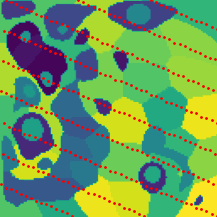

In [37]:
display(Image(filename=path+"clusters.gif", format='png'))

## Spread local avant assimilation

In [57]:
arrays_var = [np.var(array.T,axis=1) for array in arrays_av]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_var]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
#print(vmin, vmax)
vmin = 0
vmax = 77
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    #plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    plt.figure(figsize=(10, 8))
    sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"spread_av.gif", images, duration=8) # durée en secondes

/tmp/ipykernel_6727/131143534.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## Ensemble après assimilation

In [12]:


# Charger les matrices à partir des fichiers
file_paths = [
    f"{path}E_ap/E_ap_{i}.npy" for i in range(105, 610, 5)
]

arrays_ap = [np.load(file_path) for file_path in file_paths]
arrays_mean_ap = [np.mean(array,axis=0) for array in arrays_ap]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_mean_ap]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
#print(vmin, vmax)
vmin = -65
vmax = 72
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    plt.figure(figsize=(10, 8))
    plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    #sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"E_ap.gif", images, duration=8) # durée en secondes

/tmp/ipykernel_7035/1797605278.py:32: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## RMSE locale après assimilation

In [59]:
arrays_rmse = [compute_rmse(array1,array2) for array1,array2 in zip(arrays_truth,arrays_mean_ap)]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_rmse]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
#print(vmin, vmax)
vmin = 0
vmax = 58
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    #plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    plt.figure(figsize=(10, 8))
    sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"RMSE_ap.gif", images, duration=8) # durée en secondes

/tmp/ipykernel_6727/864026705.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## Spread local après assimilation

In [60]:
arrays_var = [np.var(array.T,axis=1) for array in arrays_ap]

# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_var]

# Calculer les bornes de l'échelle de couleur
#vmin = min(array.min() for array in arrays_reshaped)
#vmax = max(array.max() for array in arrays_reshaped)
#print(vmin, vmax)
vmin = 0
vmax = 77
# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    #plt.imshow(array, vmin=vmin, vmax=vmax, cmap='viridis')
    plt.figure(figsize=(10, 8))
    sns.heatmap(array, vmin=vmin, vmax=vmax, cmap='viridis', cbar=False, square=True)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"spread_ap.gif", images, duration=1) # durée en secondes

/tmp/ipykernel_6727/4029834217.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## RMSE globale après assimilation

In [61]:
# Charger les données du fichier CSV
file_path_c = path+"rmse_cluster_min_R4_nblimit5_seuil20_v2.csv"
path_o = "/home/smauran/Developpement/QG_standalone_counillon/resultats_rmse/"
file_path_o = path_o+"rmse_LETKF.csv"
data_c = pd.read_csv(file_path_c)
data_o = pd.read_csv(file_path_o)

# Vérifier que RMSE_ap est dans les colonnes
if 'RMSE_ap_assim' not in data_c.columns:
    raise ValueError("La colonne 'RMSE_ap_assim' n'existe pas dans le fichier CSV.")

# Créer un dossier temporaire pour stocker les images
os.makedirs("temp_images", exist_ok=True)


filtered_data_c = data_c['RMSE_ap_assim'][105::5]
filtered_data_o = data_o['RMSE_ap_assim'][105:610:5]

# Générer les images de la courbe de progression du RMSE_ap
filenames = []
for i in range(1, len(filtered_data_c) + 1):
    plt.figure()
    
    plt.title(f"Progression du RMSE après l'assimilation")
    plt.xlabel("Index", fontsize=12)
    plt.ylabel("RMSE_ap", fontsize=12)
    # Ajuster les limites des axes
    plt.xlim(100, 5*(len(filtered_data_c)+2)+100)
    plt.ylim(0.003, max(filtered_data_c[::-1]) * 1.1)  # Ajouter un peu d'espace au-dessus de la valeur max
    plt.annotate(f"Analyse {(i+1)*5 + 100}", xy=(0.5, 0.95), xycoords='axes fraction', ha='center', fontsize=12)
    plt.plot(filtered_data_c[:i], label='LETKF cluster, R = 4, seuil = 20')
    plt.plot(filtered_data_o[:i], label='LETKF classique')
    plt.legend()
    filename = f"temp_images/frame_{i}.png"
    filenames.append(filename)
    plt.savefig(filename)
    plt.close()

# Créer le GIF à partir des images générées
with imageio.get_writer(path+'rmse_ap_progression.gif', mode='I', duration=8) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# Supprimer les images temporaires
for filename in filenames:
    os.remove(filename)
os.rmdir("temp_images")

FileNotFoundError: [Errno 2] No such file or directory: '/home/smauran/Developpement/QG_standalone_counillon/analyse_LETKF/rmse_cluster_min_R4_nblimit5_seuil20_v2.csv'

In [25]:
''' arrays_diff = [array_av-array_ap for array_av,array_ap in zip(arrays_av,arrays_ap)]
arrays_mean = [np.mean(array,axis=0) for array in arrays_diff]
# Reshape les matrices en 2D (129, 129)
arrays_reshaped = [array.reshape((129, 129),order='F') for array in arrays_mean]


# Créer des images à partir des matrices reshaped
image_paths = []
for i, array in enumerate(arrays_reshaped):
    plt.imshow(array)
    plt.scatter(cols, rows, c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"Diff_ap_av_817_840.gif", images, duration=5) # durée en secondes '''

/tmp/ipykernel_795851/525609645.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(image_path) for image_path in image_paths]


## SRF local

In [5]:
R_inv = np.load('/home/smauran/Developpement/QG_standalone_counillon/save_mat/R_inv.npy')
Nx = 16641

In [18]:
def SRF_loc(Pf, Pa, obs_ind, R_inv,H):
    SRF_carte = np.zeros((Nx))
    for i in range(len(obs_ind)):
        H = np.zeros((len(obs_ind),Nx))
        H[i,obs_ind[i]]=1
        R_inv_loc = np.zeros(np.shape(R_inv))
        R_inv_loc[i,i] = R_inv[i,i]
        tr_SF = np.trace(H@Pf@H.T@R_inv)
        tr_SA = np.trace(H@Pa@H.T@R_inv)
        if (tr_SF != 0 and tr_SA != 0):
            SRF_carte[obs_ind[i]] = np.sqrt(tr_SF/tr_SA)-1
    SRF_carte = np.reshape(SRF_carte,(129,129),order='F')
    return(SRF_carte)

In [6]:
file_paths_Pf = [
    f"{path}Pf/Pf_{i}.npy" for i in range(105, 620, 5)
]

file_paths_Pa = [
    f"{path}Pa/Pa_{i}.npy" for i in range(105, 620, 5)
]

In [6]:
''' # Charger les matrices à partir des fichiers


#arrays_Pf = [np.load(file_path) for file_path in file_paths_Pf]
#arrays_Pa = [np.load(file_path) for file_path in file_paths_Pa]

image_paths = []
for i in range(len(arrays_Pf)):
    ind = 5*(i+1)+100
    Pf = np.load(file_paths_Pf[i])
    Pa = np.load(file_paths_Pa[i])
    H = np.zeros((len(arrays_obs_ind[i]),Nx))
    for j in range(len(arrays_obs_ind[i])):
        obs_ind = arrays_obs_ind[i]
        H[j,obs_ind[j]]=1
    SRF_carte = SRF_loc(arrays_Pf[i], arrays_Pa[i], arrays_obs_ind[i], R_inv,H)
    plt.imshow(SRF_carte)
    plt.scatter(cols_obs_ind[i], rows_obs_ind[i], c='red', s=3)
    image_path = f"image_{i}.png"
    plt.axis('off')
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0)
    image_paths.append(image_path)
    plt.close()

# Créer un GIF à partir des images
images = [imageio.imread(image_path) for image_path in image_paths]
imageio.mimsave(path+"SRF_local.gif", images, duration=8) # durée en secondes '''
    


: 

: 

## SRF global

In [7]:
def SRF_global(Pf,Pa,H,R_inv):
    SF = H@Pf@H.T@R_inv
    SA = H@Pa@H.T@R_inv
    return(np.sqrt(np.trace(SF)/np.trace(SA))-1)

In [63]:
import csv
filenames = []
prog_SRF = []

# Créer un dossier temporaire pour stocker les images
os.makedirs("temp_images", exist_ok=True)
for i in range(len(file_paths_Pf)-1):
    ind = 5*(i+1)+100
    Pf = np.load(file_paths_Pf[i])
    Pa = np.load(file_paths_Pa[i])
    H = np.zeros((len(arrays_obs_ind[i]),Nx))
    for j in range(len(arrays_obs_ind[i])):
        obs_ind = arrays_obs_ind[i]
        H[j,obs_ind[j]]=1
    SRF_g = SRF_global(Pf, Pa, H, R_inv)
    prog_SRF.append(SRF_g)
    with open("srf_global.csv", "a", newline='') as csv_file:
        spamwriter = csv.writer(csv_file)
        spamwriter.writerow([ind,SRF_g])
    plt.figure()
    plt.title(f"Progression du SRF global")
    plt.xlabel("Index", fontsize=12)
    plt.ylabel("SRF global", fontsize=12)
    plt.xlim(0,105)
    plt.ylim(0, 0.8)  # Ajouter un peu d'espace au-dessus de la valeur max
    plt.annotate(f"Analyse {(i+1)*5 + 100}", xy=(0.5, 0.95), xycoords='axes fraction', ha='center', fontsize=12)
    plt.plot(prog_SRF[:i])
    filename = f"temp_images/frame_{i}.png"
    filenames.append(filename)
    plt.savefig(filename)
    plt.close()

# Créer le GIF à partir des images générées
with imageio.get_writer(path+'srf_global_progression.gif', mode='I', duration=8) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# Supprimer les images temporaires
for filename in filenames:
    os.remove(filename)
os.rmdir("temp_images")

FileNotFoundError: [Errno 2] No such file or directory: '/home/smauran/Developpement/QG_standalone_counillon/analyse_LETKF/Pf/Pf_105.npy'

In [89]:
# Charger les données du fichier CSV
file_path_c = "/home/smauran/Developpement/QG_standalone_counillon/analyse_R4_seuil20/srf_global.csv"
file_path_o = "/home/smauran/Developpement/QG_standalone_counillon/analyse_LETKF/srf_global.csv"

data_c = pd.read_csv(file_path_c)
data_o = pd.read_csv(file_path_o)

# Vérifier que RMSE_ap est dans les colonnes
if 'SRF_global' not in data_c.columns:
    raise ValueError("La colonne 'SRF_global' n'existe pas dans le fichier CSV.")

# Créer un dossier temporaire pour stocker les images
os.makedirs("temp_images", exist_ok=True)

cycle = data_c['n'][:]
#print(cycle)

nb_cycles = max(cycle[::-1])
filtered_data_c = data_c['SRF_global'][:]
filtered_data_o = data_o['SRF_global'][:]

# Générer les images de la courbe de progression du SRF
filenames = []
for c in cycle:
    i = int(((c-100)/5)-1)
    plt.figure()
    
    plt.title(f"Progression du SRF")
    plt.xlabel("Index", fontsize=12)
    plt.ylabel("SRF", fontsize=12)
    # Ajuster les limites des axes
    plt.xlim(100, nb_cycles+1)
    plt.ylim(0.003, max(filtered_data_o[::-1]) )  # Ajouter un peu d'espace au-dessus de la valeur max
    plt.annotate(f"Analyse {c}", xy=(0.5, 0.95), xycoords='axes fraction', ha='center', fontsize=12)
    plt.plot(cycle [:i], filtered_data_c[:i], label='LETKF cluster, R = 4, seuil = 20')
    plt.plot(cycle [:i], filtered_data_o[:i], label='LETKF classique')
    plt.legend()
    filename = f"temp_images/frame_{i}.png"
    filenames.append(filename)
    plt.savefig(filename)
    plt.close()

# Créer le GIF à partir des images générées
with imageio.get_writer(path+'srf_progression.gif', mode='I', duration=8) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# Supprimer les images temporaires
for filename in filenames:
    os.remove(filename)
os.rmdir("temp_images")

/tmp/ipykernel_6727/669537660.py:46: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


## Compilation des résultats 

In [15]:
from PIL import Image, ImageDraw, ImageFont

path_LETKF = "/home/smauran/Developpement/QG_standalone_counillon/analyse_LETKF/"
path_cluster = "/home/smauran/Developpement/QG_standalone_counillon/analyse_R4_seuil20/"


# Load the GIFs
gif_paths = [
    #path_LETKF+"truth.gif",
    path_cluster+"truth.gif",
    path_LETKF+"E_ap.gif",
    #path_cluster+"E_av.gif",
    path_cluster+"E_ap.gif",
    #path_LETKF+"spread_ap.gif",
    #path_cluster+"spread_av.gif",
    #path_cluster+"spread_ap.gif",
    #path+"clusters.gif",
    #path_LETKF+"RMSE_ap.gif",
    #path_cluster+"RMSE_av.gif",
    #path_cluster+"RMSE_ap.gif",
    path_cluster+"compar_spread_av.gif",
    path_cluster+"compar_spread_ap.gif",
    path_cluster+"compar_RMSE_av.gif",
    path_cluster+"compar_RMSE_ap.gif",
    path_cluster+"rmse_ap_progression.gif",
    path_cluster+"srf_progression.gif"
]

gifs = [Image.open(gif_path) for gif_path in gif_paths]

# Set the names to be displayed under each GIF
#names = ["Truth ", "E av", "E ap", "Spread av", "Spread ap", "Evolution SRF global", "Clusters", "RMSE_ap", "Evolution RMSE"]
names = ["Truth", "E ap LETKF", "E ap cluster", "compar_spread_av", "compar_spread_ap","compar_RMSE_ap LETKF", "compar_RMSE_ap cluster", "Evolution RMSE", "Evolution SRF"]

# Determine the font size and load a default font
font_size = 20
font = ImageFont.load_default()

# Extract width and height from the first GIF
width, height = gifs[0].size
gifs_per_row = 3  # Number of GIFs per row
total_width = width * gifs_per_row
total_height = (height + font_size + 10) * ((len(gifs) + gifs_per_row - 1) // gifs_per_row)  # Additional height for text

# Determine the number of frames in each GIF
num_frames = min(gif.n_frames for gif in gifs)

# Déterminer le nombre de frames dans chaque GIF
num_frames = min(gif.n_frames for gif in gifs)

# Créer de nouveaux frames avec les noms et les points
new_gif_frames = []
for frame_index in range(num_frames):
    new_frame = Image.new('RGB', (total_width, total_height), 'white')
    draw = ImageDraw.Draw(new_frame)
    for i, gif in enumerate(gifs):
        gif.seek(frame_index)
        frame = gif.copy()
        x_offset = (i % gifs_per_row) * width
        y_offset = (i // gifs_per_row) * (height + font_size + 10)
        new_frame.paste(frame, (x_offset, y_offset))
        text_bbox = draw.textbbox((0, 0), names[i], font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_x = x_offset + (width - text_width) // 2
        text_y = y_offset + height + 5  # Position du texte sous le GIF
        draw.text((text_x, text_y), names[i], fill="black", font=font)
    new_gif_frames.append(new_frame)

# Sauvegarder le GIF combiné avec les noms
combined_gif_with_names_path = path_cluster + "compar_LETKFs_bis.gif"
new_gif_frames[0].save(combined_gif_with_names_path, save_all=True, append_images=new_gif_frames[1:], loop=0, duration=1000)  

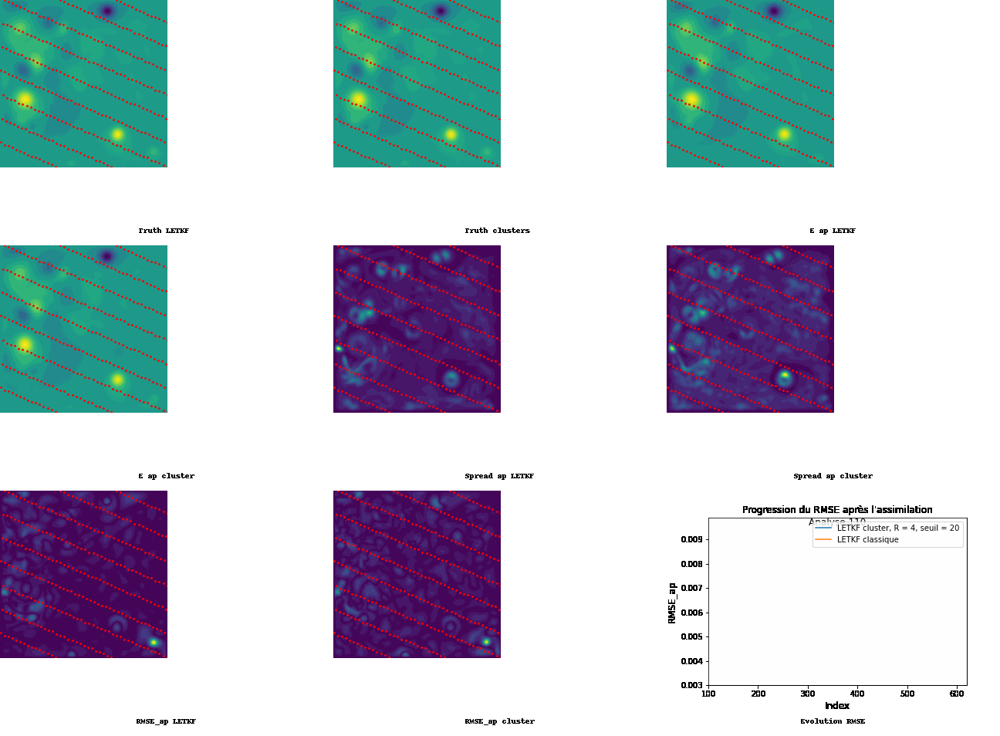

In [29]:
from IPython.display import Image, display
display(Image(filename=path+"compar_gif.gif", format='png'))